### PART A: Image denoising

In [1]:
# libraries to be imported
import os
import cv2
from matplotlib import pyplot as plt
from skimage.restoration import (denoise_wavelet)
from skimage import metrics
from skimage import img_as_float
from skimage.metrics import structural_similarity as ssim
from skimage.metrics import mean_squared_error


In [2]:
#Create variables 

directory = 'Part-I-Dataset-denoising' # The directory that we want to search in and create folders in
original_folder = directory + '/original' 
noisy_folders = [directory + '/noisy10', directory + '/noisy25', directory + '/noisy50']
noisy_levels = ['noisy10', 'noisy25', 'noisy50']
denoising = ['mean', 'median', 'wavelet', 'deep_learning']


# Use os.mkdir to create folders to store output results.
os.mkdir(directory + '/Results ') # Create Results Folder.
for folders in noisy_folders: # Create Denoised Folder, for each Noisy directory.
        for method in denoising:
            path = folders + "-denoised-" + method
            os.mkdir(path)


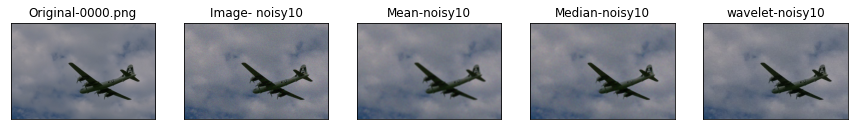

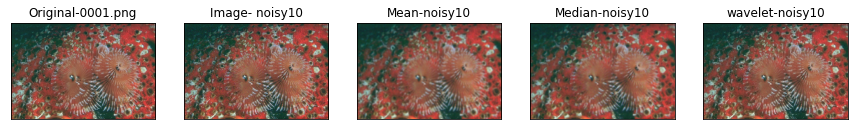

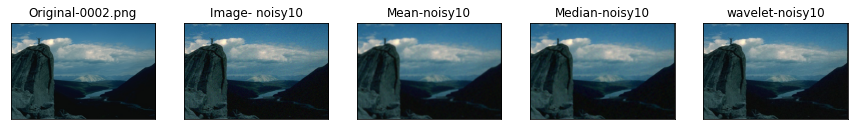

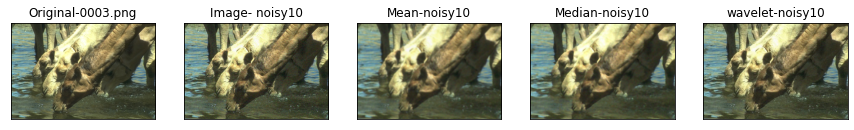

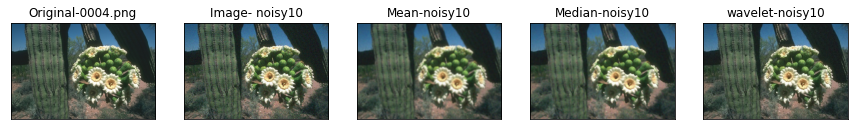

...

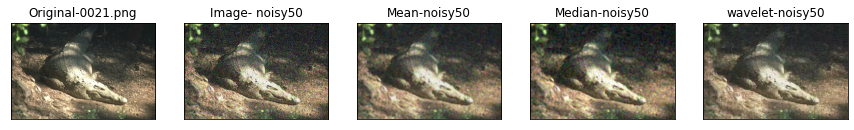

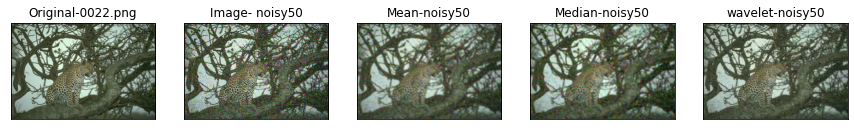

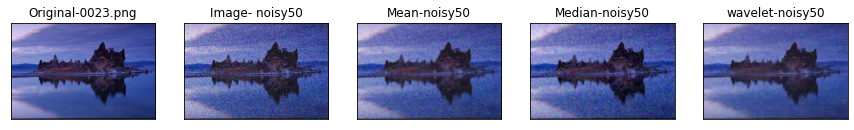

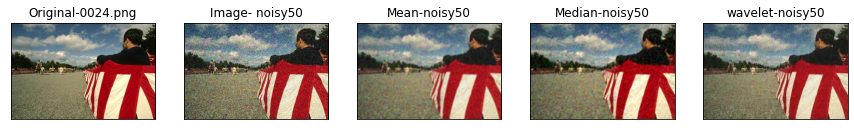

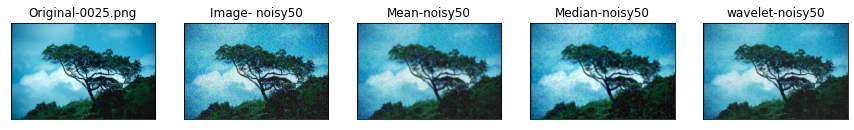

In [3]:

# Adjust figure sizes
plt.rcParams['figure.figsize'] = [15, 10]

#Create path to write the csv file to
for levels in noisy_levels:
    with open(directory + '/Results/' + levels + '-Results Table.csv', 'w') as f:    
        f.write("Image,MSE Original,MSE Noisy,MSE Mean Denoised,MSE Median Denoised,MSE Wavelet Denoised,MSE DL Denoised,SSIM Original,SSIM Noisy,SSIM Mean Denoised,SSIM Median Denoised,SSIM Wavelet Denoised,SSIM DL Denoised")
    
    #going through each file in the directory specified and return them numerically sorted.
    noisy_directory = directory + '/' + levels
    files = sorted(os.listdir(noisy_directory)) 

    for i in range(len(files)):
        original_img = cv2.imread(original_folder + '/' + files[i])
        noisy_img = cv2.imread(noisy_directory + '/' + files[i])
        
        
        #apply the different denoisning methods
        #apply mean filter
        #Write each returned file to the folder specified 
        mean_denoised = cv2.blur(noisy_img,(5,5))
        cv2.imwrite(noisy_directory + "-denoised-" + denoising[0] + "/" + files[i], mean_denoised) 
    
        
        #apply median filter
        median_denoised = cv2.medianBlur(noisy_img,5)
        cv2.imwrite(noisy_directory + "-denoised-" + denoising[1] + "/" + files[i], median_denoised)
        
        #apply wavelet
        wavelet_denoised = denoise_wavelet(noisy_img, method = "BayesShrink", mode="soft", multichannel=True, convert2ycbcr=True)
        cv2.imwrite(noisy_directory + "-denoised-" + denoising[2] + "/" + files[i], 255*wavelet_denoised)
        
        #apply deep learning
        dl_denoised = original_img #model.predict(noisy_img, target_size =(32,32)) ##
        cv2.imwrite(noisy_directory + "-denoised-" + denoising[3] + "/" + files[i], dl_denoised)
        
                                              
                                              
        #Plot the original, different noisy and the denoised images.
        
                                              
        plt.subplot(151), plt.imshow(cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB))
        plt.title('Original-' + files[i]), plt.xticks([]), plt.yticks([])

        plt.subplot(152),plt.imshow(cv2.cvtColor(noisy_img, cv2.COLOR_BGR2RGB))
        plt.title('Image- ' + levels), plt.xticks([]), plt.yticks([])

        plt.subplot(153),plt.imshow(cv2.cvtColor(mean_denoised, cv2.COLOR_BGR2RGB))
        plt.title('Mean-' + levels), plt.xticks([]), plt.yticks([])

        plt.subplot(154),plt.imshow(cv2.cvtColor(median_denoised, cv2.COLOR_BGR2RGB))
        plt.title('Median-' + levels), plt.xticks([]), plt.yticks([])

        plt.subplot(155),plt.imshow(cv2.cvtColor(wavelet_denoised.astype ('float32'), cv2.COLOR_BGR2RGB))
        plt.title('wavelet-' + levels), plt.xticks([]), plt.yticks([])
        plt.show()
        plt.close()
                      
            
        #Compare the original,noisy and denoided images using MSE and SSIM 
                 
        #MSE and SSIM of original images with themselves
        original_mse = metrics.mean_squared_error(original_img, original_img)
        original_ssim = ssim(original_img, original_img, data_range=original_img.max()-original_img.min(), multichannel=True)

        #MSE and SSIM of original images with noisy (10,25,50) images
        noisy_mse = metrics.mean_squared_error(original_img, noisy_img)
        noisy_ssim = ssim(original_img, noisy_img, data_range=noisy_img.max()-noisy_img.min(), multichannel=True)   
        
        #MSE and SSIM of original images and mean denoised images
        mean_mse = metrics.mean_squared_error(original_img, mean_denoised)
        mean_ssim = ssim(original_img, mean_denoised, data_range=mean_denoised.max()-mean_denoised.min(), multichannel=True)

        #MSE and SSIM of original images and median denoised images
        median_mse = metrics.mean_squared_error(original_img, median_denoised)
        median_ssim = ssim(original_img, median_denoised, data_range=median_denoised.max()-median_denoised.min(), multichannel=True)

        #MSE and SSIM of original images and wavelet denoised images
        wavelet_mse = metrics.mean_squared_error(original_img, wavelet_denoised)
        wavelet_ssim = ssim(original_img, wavelet_denoised, data_range=wavelet_denoised.max()-wavelet_denoised.min(), multichannel=True)

        #MSE and SSIM of original images and deep learning denoised images
        dl_mse = metrics.mean_squared_error(original_img, dl_denoised)
        dl_ssim = ssim(original_img, dl_denoised, data_range=dl_denoised.max()-dl_denoised.min(), multichannel=True)                                      
                                              

        #Writing the results to a csv file in the Results folder
        with open(directory + '/Results/' + levels + '-Results Table.csv', 'a') as f:
            f.write(
                "\n" +
                files[i] + "," +                     #2f is to specify two decimal places
                f"{original_mse:.2f}" + "," +
                f"{noisy_mse:.2f}" + "," +
                f"{mean_mse:.2f}" + "," +
                f"{median_mse:.2f}" + "," +
                f"{wavelet_mse:.2f}" + "," +
                f"{dl_mse:.2f}" + "," +
                f"{original_ssim:.2f}" + "," +
                f"{noisy_ssim:.2f}" + "," +
                f"{mean_ssim:.2f}" + "," +
                f"{median_ssim:.2f}" + "," +
                f"{wavelet_ssim:.2f}" + "," +
                f"{dl_ssim:.2f}"
            )
        